In [ ]:
"""
Copyright 2024 Rafael Perez Martinez

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
""";

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
from matplotlib.pyplot import figure

from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

hfont = {'fontname':'Arial'}
import plotly.express as px
import plotly.graph_objects as go

import os
import sys
sys.path.append(os.path.abspath('..'))

import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

np.random.seed(4)
from scipy.stats import norm
from hola.algorithm import HOLA
from scipy.stats.qmc import Sobol
from hola.tune import tune
import random
pd.set_option('display.max_columns', None)
import timeit
from mpl_toolkits.mplot3d import Axes3D

In [2]:
df = pd.read_csv(r'./data/df_simulated_small_signal_filtered.csv')  
df = df[df['VGS'] <= -1] # Removes all VGS values greater than -1 V
df['nf_min'] = -abs(df['nf_min'])


data_min = df.groupby(['VDS', 'Wg', 'nfing', 'gdg_val', 'gsg_val']).agg(['min'])
data_min.to_csv(r'./file_check/file_grouped.csv')
df_min = pd.read_csv(r'./file_check/file_grouped.csv')  
arr = df_min.to_numpy()
arr_min = arr[2:, :] 
df_min.to_csv(r'./file_check/file_grouped_post_process.csv')

arr_vds = (arr_min[:, 0]).astype(float)
arr_wg = (arr_min[:, 1]).astype(float)
arr_nfing = (arr_min[:, 2]).astype(float)
arr_gdg = (arr_min[:, 3]).astype(float)
arr_gsg = (arr_min[:, 4]).astype(float)
arr_area = arr_nfing*arr_wg

arr_fT = (arr_min[:, 7]).astype(float) 
arr_fmax = (arr_min[:, 8]).astype(float) 
arr_NF = abs((arr_min[:, 9]).astype(float)) 
arr_gain = (arr_min[:, 10]).astype(float)

vds_count = len(np.unique(arr_vds))
wg_count = len(np.unique(arr_wg))
nfing_count = len(np.unique(arr_nfing))
gdg_count = len(np.unique(arr_gdg))
gsg_count = len(np.unique(arr_gsg))
print(vds_count)
print(wg_count)
print(nfing_count)
print(gdg_count)
print(gsg_count)

total_count = vds_count*wg_count*nfing_count*gdg_count*gsg_count

print(total_count)

7
7
4
3
4
2352


In [3]:
def is_pareto_efficient(costs):
    is_efficient = np.ones(costs.shape[0], dtype=bool)
    for i, cost in enumerate(costs):
        if is_efficient[i]:
            is_efficient[i] = np.all(np.any(costs>=cost, axis=1))
    return is_efficient

data = np.column_stack((-arr_fmax, -arr_gain, arr_NF))
pareto_efficient = is_pareto_efficient(data)

pp = data[pareto_efficient] # Non-dominated points

dp = data[~pareto_efficient] # Dominated points

# To get back the original values, multiply the first three columns by -1
pp[:, :2] *= -1
dp[:, :2] *= -1
print(pp.shape)
print(dp.shape)

(60, 3)
(2292, 3)


<ipython-input-4-2434345f149d>:69: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(x_ranges[i])
<ipython-input-4-2434345f149d>:70: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set_ylim(y_ranges[i])


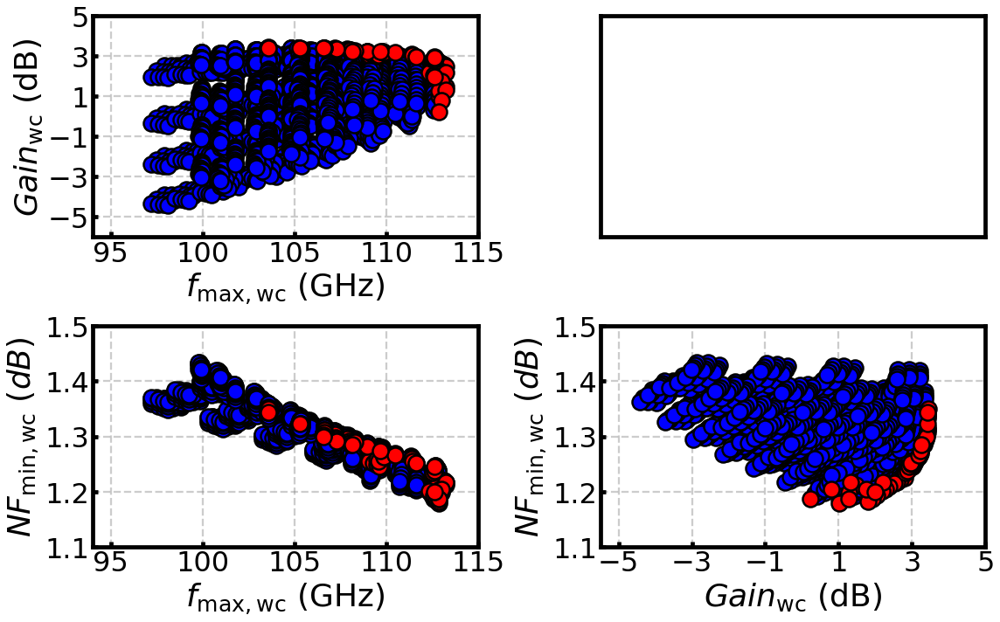

In [4]:
data1_x = dp[:,0]
data1_y = dp[:,1]
data2_x = dp[:,0]
data2_y = dp[:,1]
data3_x = dp[:,0]
data3_y = dp[:,2]
data4_x = dp[:,1]
data4_y = dp[:,2]

data1_x2 = pp[:,0]
data1_y2 = pp[:,1]
data2_x2 = pp[:,0]
data2_y2 = pp[:,1]
data3_x2 = pp[:,0]
data3_y2 = pp[:,2]
data4_x2 = pp[:,1]
data4_y2 = pp[:,2]

x_labels = [
    r'$f_{\mathrm{max,wc}}$ (GHz)',
    r'',
    r'$f_{\mathrm{max,wc}}$ (GHz)',
    r'$Gain_{\mathrm{wc}}$ (dB)'
]

y_labels = [
    r'$Gain_{\mathrm{wc}}$ (dB)',
    r'',
    r'$NF_{\mathrm{min,wc}}$ ($dB$)',
    r'$NF_{\mathrm{min,wc}}$ ($dB$)'
]

x_ticks = [
    np.arange(95, 116, 5),
    np.arange(0, 0, 1),
    np.arange(95, 116, 5),
    np.arange(-5, 6, 2)
]

y_ticks = [
    np.arange(-5, 6, 2),
    np.arange(0, 0, 1),
    np.arange(1.1, 1.6, 0.1),
    np.arange(1.1, 1.6, 0.1)
]

x_ranges = [
    (94, 115),
    (0, 0),
    (94, 115),
    (-5.5, 5)
]

y_ranges = [
    (-6, 5),
    (0, 0),
    (1.1, 1.5),
    (1.1, 1.5)
]

fig, axs = plt.subplots(2, 2, figsize=(16, 10))  # Adjusted for 2x2 subplots

for i, ax in enumerate(axs.flat):
    ax.scatter(eval(f'data{i+1}_x'), eval(f'data{i+1}_y'), color='blue', label='Dominated', edgecolors='black', linewidths=2.5, s=325, zorder=2)
    ax.scatter(eval(f'data{i+1}_x2'), eval(f'data{i+1}_y2'), color='red', label='Pareto', edgecolors='black', linewidths=2.5, s=325, zorder=3)

    ax.set_xticks(x_ticks[i])
    ax.set_yticks(y_ticks[i])
    ax.set_xlim(x_ranges[i])
    ax.set_ylim(y_ranges[i])
    ax.set_xlabel(x_labels[i], fontsize=36, color='black')
    ax.set_ylabel(y_labels[i], fontsize=36, color='black')

    line_width = 4.75
    for spine in ax.spines.values():
        spine.set_linewidth(line_width)

    ax.tick_params(axis='both', which='major', direction='in', length=6, width=4.75, colors='black', labelsize=32)
    ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1, colors='black')

    ax.grid(True, which='both', color='grey', linestyle='--', linewidth=2.25, zorder=0, alpha=0.4)

plt.show()
# fig.savefig("Fig_5_v2.pdf", format='pdf', bbox_inches='tight')


In [5]:
def plot_pareto_frontier_3d(data, pareto_front):
    fig = plt.figure(figsize=(7, 7), dpi=1000)  # Increased figure size

    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(data[:, 0], data[:, 1], data[:, 2], c='blue', s=250,edgecolors='black', linewidths=1.5, zorder=2, alpha=0.1)
    ax.scatter(pareto_front[:, 0], pareto_front[:, 1], pareto_front[:, 2], c='red', s=250, edgecolors='black', linewidths=1.5, zorder=3, alpha=1)

    ax.set_xlabel(r'$f_{\mathrm{max,wc}}$ (GHz)', fontsize=22, color='black', labelpad=20)
    ax.set_ylabel(r'$Gain_{\mathrm{wc}}$ (dB)', fontsize=22, color='black', labelpad=20)
    ax.set_zlabel(r'$NF_{\mathrm{min,wc}}$ ($dB$)', fontsize=22, color='black', labelpad=20)

    ax.set_xlim([95, 115])
    ax.set_ylim([-5, 5])
    ax.set_zlim([1.1, 1.5])  
    
    x_ticks = np.arange(95, 116, 5)
    y_ticks = np.arange(-5, 6, 2)
    z_ticks = np.arange(1.1, 1.6, 0.1)  

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_zticks(z_ticks)

    for t in ax.get_xticklabels():
        t.set_rotation(45)
    for t in ax.get_yticklabels():
        t.set_rotation(45)

    ax.tick_params(axis='both', which='major', direction='in', length=0, width=0, colors='black', labelsize=17, zorder=0)
    ax.tick_params(axis='both', which='minor', direction='in', length=0, width=0, colors='black', zorder=0)

    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

    for a in (ax.w_xaxis, ax.w_yaxis, ax.w_zaxis):
        for t in a.get_ticklines() + a.get_ticklabels():
            t.set_visible(True)
        a.line.set_visible(True)
        a.pane.set_visible(True)

    ax.grid(True, linestyle='--', color='gray', linewidth=4.25, alpha=0.1)
    ax.xaxis._axinfo["grid"]['linestyle'] = "--"
    ax.yaxis._axinfo["grid"]['linestyle'] = "--"
    ax.zaxis._axinfo["grid"]['linestyle'] = "--"

    plt.tight_layout()
    plt.show()
#     fig.savefig("Fig_6_v2.pdf", format='pdf', bbox_inches='tight')

plot_pareto_frontier_3d(dp, pp)


In [6]:
data_attr = np.column_stack((arr_vds , arr_nfing, arr_wg, arr_gdg, arr_gsg))
data_attr_pareto = data_attr[pareto_efficient]

headers = ["VDS", "nfing", "wf", "gdg", "gsg"]

df = pd.DataFrame(data_attr_pareto, columns=headers)

df.to_csv(r'./Pareto_designs/small_signal_pareto.csv', index=False)

In [7]:
val_vds = np.unique(arr_vds).tolist()
val_wg = np.unique(arr_wg).tolist()
val_nfing = np.unique(arr_nfing).tolist()
val_gdg = np.unique(arr_gdg).tolist()
val_gsg = np.unique(arr_gsg).tolist()

In [8]:
def run_HOLA(num_runs, target_1, limit_1, priority_1, target_2, limit_2, priority_2, target_3, limit_3, priority_3):    
    params_config = {
        "vds":{
            "min":16,
            "max":28,
            "param_type": "int",
            "values": val_vds
        },
        "nfing":{
            "min":2,
            "max":8,
            "param_type": "int",
            "values": val_nfing
        },
        "wg":{
            "min":25,
            "max":100,
            "param_type": "int",
            "values": val_wg
        },
        "gdg":{
            "min":22,
            "max":52,
            "param_type": "int",
            "values": val_gdg
        },
        "gsg":{
            "min":33,
            "max":78,
            "param_type": "int",
            "values": val_gsg
        }
    }

    objectives_config = {
        "fmax":{
            "target":target_1,
            "limit":limit_1,
            "priority": priority_1
        },
         "Gain":{
            "target":target_2,
            "limit":limit_2,
            "priority": priority_2
        },
        "NF_min":{
            "target":target_3,
            "limit":limit_3,
            "priority": priority_3
        }
    }
    vds = arr_vds
    wg = arr_wg
    nfing = arr_nfing
    gdg = arr_gdg
    gsg = arr_gsg
    fmax = arr_fmax
    Gain = arr_gain
    NF_min = arr_NF



    def look_up(x1, x2, x3, x4, x5):
        xx = np.where((vds == x1) & (wg == x2) & (nfing == x3) & (gdg == x4) & (gsg == x5))
        if len(xx[0]) == 0:
            raise ValueError("No valid combination found for the provided inputs.")
        yy = random.choice(xx) 
        return random.choice(fmax[yy]), random.choice(Gain[yy]), random.choice(NF_min[yy])


    def func(vds, wg, nfing, gdg, gsg):
        fmax, Gain, NF_min  = look_up(vds, wg, nfing, gdg, gsg)
        return fmax, Gain, NF_min

    def run(vds, wg, nfing, gdg, gsg):
        try:
            fmax, Gain, NF_min = func(vds, wg, nfing, gdg, gsg)
            return {"fmax": fmax, "Gain": Gain, "NF_min": NF_min}
        except ValueError as e:
            print(str(e))
            return {"fmax": 0, "Gain": 0, "NF_min": 0}

    
    start = timeit.default_timer()

    tuner = tune(run, params_config, objectives_config, num_runs= num_runs, n_jobs=1)

    stop = timeit.default_timer()

    print('Time: ', stop - start) 

    print(tuner.get_best_params())
    print(tuner.get_best_scores())
    
    data = tuner.get_leaderboard()
    n = data.shape[0]
    ne = int(n*0.4)
    xs = data['fmax'].values
    ys = data['Gain'].values
    zs = data['NF_min'].values

    xe = xs[:ne]
    ye = ys[:ne]
    ze = zs[:ne]

    xb = xs[ne:]
    yb = ys[ne:]
    zb = zs[ne:]
    leaderboard = tuner.get_leaderboard()
    pd.set_option('display.max_rows', 100)
    display(leaderboard)
    return xe, ye, ze, xb, yb, zb, leaderboard

In [9]:
def scalarize(target, limit, priority, value):
    if not isinstance(value, np.ndarray):
        value = np.array(value)

    if limit < target:
        result = np.where(value < limit, np.inf, 
                  np.where(value > target, 0.0, 
                  priority - priority * (value - limit) / (target - limit)))
    else:
        result = np.where(value < target, 0.0, 
                  np.where(value > limit, np.inf, 
                  priority * (value - target) / (limit - target)))

    return result

def calc_score(targets):
    fmax_score = scalarize(targets[0]['target'], targets[0]['limit'], targets[0]['priority'], arr_fmax)
    gain_score = scalarize(targets[1]['target'], targets[1]['limit'], targets[1]['priority'], arr_gain)
    nf_score = scalarize(targets[2]['target'], targets[2]['limit'], targets[2]['priority'], arr_NF)
    total_score = fmax_score + gain_score + nf_score
    
    return np.min(total_score)

In [10]:
def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

In [11]:
def run_HOLA_trials(trials, targets):
    score_tally = []
    
    trial_range = range(1, trials + 1)
    xx = [0, trial_range[-1]]  
    
    total_score = calc_score(targets)
    
    y_val = total_score  
    print(f"Minimum score is {y_val}")
    
    target_1, target_2, target_3 = [t['target'] for t in targets]
    limit_1, limit_2, limit_3 = [t['limit'] for t in targets]
    priority_1, priority_2, priority_3 = [t['priority'] for t in targets]
    
    xe, ye, ze, xb, yb, zb, leaderboard = run_HOLA(trials, target_1, limit_1, priority_1,
                                                   target_2, limit_2, priority_2, 
                                                   target_3, limit_3, priority_3)
    
    score_tally = leaderboard.sort_values('run', ascending=True)['score'].values
    score_tally = make_array_decreasing(np.array(score_tally))
    
    fig = plt.figure(dpi=1000)
    plt.plot(trial_range, score_tally)
    plt.plot(xx, [y_val]*2, 'k--')  
    plt.xlabel(r'Number of trials (n)')
    plt.ylabel(r'Score$^\star$')
    plt.legend(loc='upper left')
    
    for i in [0, 19, 39, 59, 79, 99]:
        print(f'The score for trial {i+1} is: {score_tally[i]}')
    
    return score_tally

Minimum score is 0.26542124999999994
Time:  0.34521584800000227
{'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 33.0}
{'fmax': 112.6332558, 'Gain': 2.9563209, 'NF_min': 1.2435817}


,run,vds,nfing,wg,gdg,gsg,fmax,Gain,NF_min,score
39,39,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.265421
70,70,20.0,4.0,37.5,22.0,33.0,111.328924,2.990540,1.261578,0.296811
94,94,20.0,4.0,37.5,22.0,33.0,111.328924,2.990540,1.261578,0.296811
92,92,20.0,4.0,25.0,22.0,33.0,112.672576,2.866915,1.245910,0.312453
74,74,20.0,4.0,25.0,22.0,33.0,112.672576,2.866915,1.245910,0.312453
82,82,20.0,4.0,25.0,22.0,33.0,112.672576,2.866915,1.245910,0.312453
71,71,18.0,4.0,25.0,22.0,33.0,112.527017,2.833556,1.234673,0.317895
90,90,18.0,4.0,25.0,22.0,33.0,112.527017,2.833556,1.234673,0.317895
85,85,18.0,4.0,25.0,22.0,33.0,112.527017,2.833556,1.234673,0.317895
98,98,20.0,4.0,37.5,22.0,48.0,111.429180,2.906265,1.256945,0.329759


No handles with labels found to put in legend.


The score for trial 1 is: inf
The score for trial 20 is: 0.36398385000000044
The score for trial 40 is: 0.26542124999999994
The score for trial 60 is: 0.26542124999999994
The score for trial 80 is: 0.26542124999999994
The score for trial 100 is: 0.26542124999999994
[       inf 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385 0.36398385
 0.36398385 0.36398385 0.36398385 0.26542125 0.26542125 0.26542125
 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125
 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125
 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125
 0.26542125 0.26542125 0.26542125 0.26542125 0.26542125 0.265421

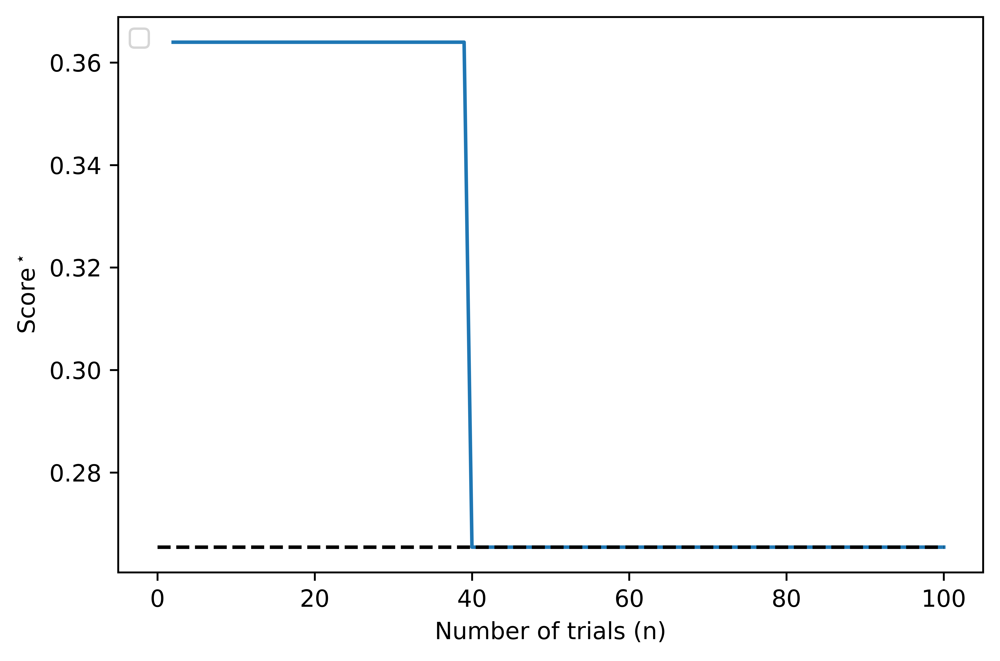

In [24]:
targets_1 = [
    {'target': 112, 'limit': 90, 'priority': 1},
    {'target': 3, 'limit': 1, 'priority': 1},
    {'target': 1, 'limit': 2, 'priority': 1}
]

score_1 = run_HOLA_trials(100, targets_1)

print(score_1)

Minimum score is 0.18895143333333336
Time:  0.34708937599999956
{'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 33.0}
{'fmax': 112.6332558, 'Gain': 2.9563209, 'NF_min': 1.2435817}


,run,vds,nfing,wg,gdg,gsg,fmax,Gain,NF_min,score
99,99,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.188951
74,74,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.188951
95,95,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.188951
77,77,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.188951
90,90,22.0,4.0,25.0,22.0,33.0,112.633256,2.956321,1.243582,0.188951
57,57,22.0,4.0,37.5,22.0,48.0,111.425923,3.043444,1.254399,0.229168
98,98,22.0,4.0,25.0,22.0,48.0,112.647315,2.858891,1.238212,0.268481
73,73,22.0,4.0,37.5,22.0,78.0,111.443115,2.890913,1.247729,0.314591
82,82,24.0,4.0,37.5,22.0,63.0,110.452167,3.019957,1.257262,0.319858
61,61,24.0,4.0,37.5,22.0,63.0,110.452167,3.019957,1.257262,0.319858


No handles with labels found to put in legend.


The score for trial 1 is: inf
The score for trial 20 is: 0.31985805833333386
The score for trial 40 is: 0.31985805833333386
The score for trial 60 is: 0.2291683750000005
The score for trial 80 is: 0.18895143333333336
The score for trial 100 is: 0.18895143333333336
[       inf 0.5601784  0.5601784  0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806 0.31985806
 0.31985806 0.31985806 0.31985806 0.22916838 0.22916838 0.22916838
 0.22916838 0.22916838 0.22916838 0.22916838 0.22916838 0.2291683

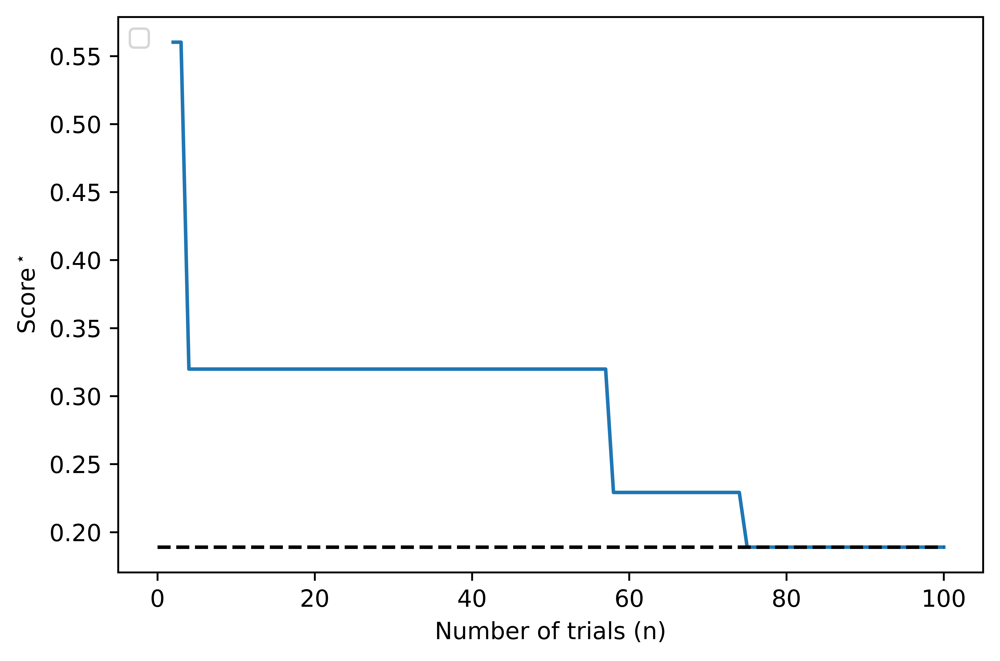

In [26]:
targets_2 = [
    {'target': 112, 'limit': 100, 'priority': 1},
    {'target': 3, 'limit': 2, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 1}
]

score_2 = run_HOLA_trials(100, targets_2)

print(score_2)

Minimum score is 0.1540506666666667
Time:  0.3330956389999926
{'vds': 16.0, 'nfing': 2.0, 'wg': 50.0, 'gdg': 22.0, 'gsg': 78.0}
{'fmax': 109.6437666, 'Gain': 3.014616, 'NF_min': 1.2462152}


,run,vds,nfing,wg,gdg,gsg,fmax,Gain,NF_min,score
94,94,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
79,79,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
92,92,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
91,91,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
80,80,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
78,78,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
83,83,16.0,2.0,50.0,22.0,78.0,109.643767,3.014616,1.246215,0.154051
20,20,18.0,2.0,50.0,22.0,78.0,109.584008,3.061424,1.255121,0.183736
64,64,18.0,2.0,50.0,22.0,78.0,109.584008,3.061424,1.255121,0.183736
96,96,18.0,2.0,50.0,22.0,78.0,109.584008,3.061424,1.255121,0.183736


No handles with labels found to put in legend.


The score for trial 1 is: 0.2917833333333338
The score for trial 20 is: 0.19769900000000004
The score for trial 40 is: 0.18373600000000023
The score for trial 60 is: 0.18373600000000023
The score for trial 80 is: 0.1540506666666667
The score for trial 100 is: 0.1540506666666667
[0.29178333 0.29178333 0.29178333 0.29178333 0.29178333 0.29178333
 0.29178333 0.29178333 0.197699   0.197699   0.197699   0.197699
 0.197699   0.197699   0.197699   0.197699   0.197699   0.197699
 0.197699   0.197699   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.183736   0.183736   0.183736   0.183736   0.183736   0.183736
 0.1

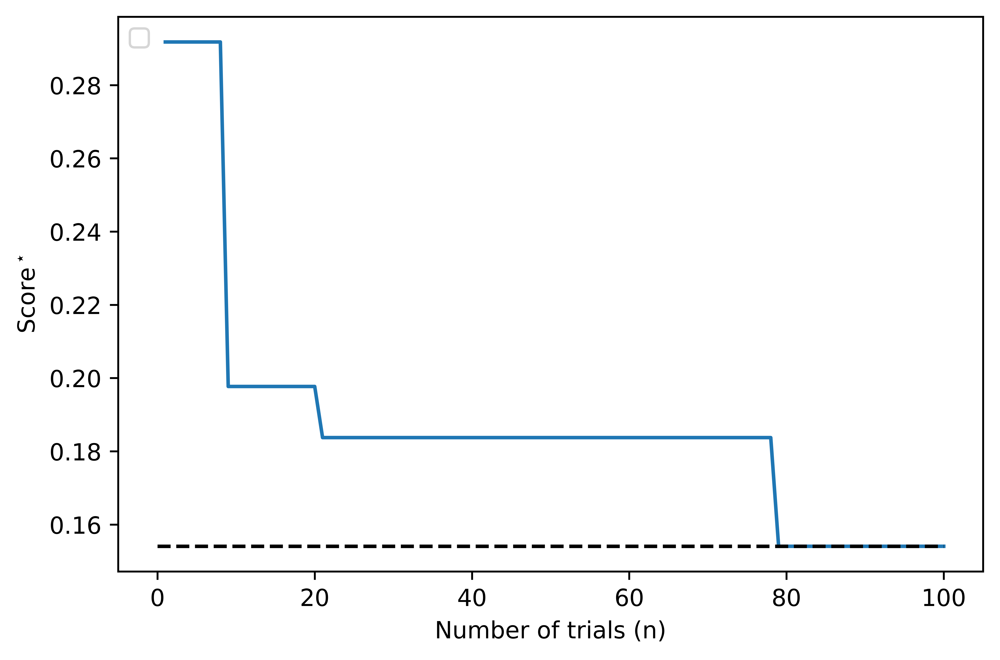

In [38]:
targets_3 = [
    {'target': 100, 'limit': 90, 'priority': 1},
    {'target': 3, 'limit': 2.5, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 1}
]

score_3 = run_HOLA_trials(100, targets_3)

print(score_3)

Minimum score is 0.0
Time:  0.35002516199999434
{'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 52.0, 'gsg': 48.0}
{'fmax': 112.582353, 'Gain': 2.0420839, 'NF_min': 1.1936032}


,run,vds,nfing,wg,gdg,gsg,fmax,Gain,NF_min,score
99,99,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
67,67,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
96,96,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
63,63,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
59,59,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
98,98,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
76,76,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
94,94,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
88,88,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000
78,78,16.0,4.0,25.0,52.0,48.0,112.582353,2.042084,1.193603,0.000000


No handles with labels found to put in legend.


The score for trial 1 is: inf
The score for trial 20 is: 0.0180666666666666
The score for trial 40 is: 0.0180666666666666
The score for trial 60 is: 0.0
The score for trial 80 is: 0.0
The score for trial 100 is: 0.0
[       inf        inf        inf 1.3924572  0.59652067 0.59652067
 0.59652067 0.59652067 0.59652067 0.59652067 0.59652067 0.59652067
 0.59652067 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667
 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667
 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667
 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667
 0.01806667 0.01806667 0.01806667 0.01806667 0.01806667 0.01118867
 0.01118867 0.01118867 0.01118867 0.01118867 0.01118867 0.01118867
 0.01118867 0.01118867 0.01118867 0.01118867 0.01118867 0.01118867
 0.01118867 0.01118867 0.01118867 0.01118867 0.01118867 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0. 

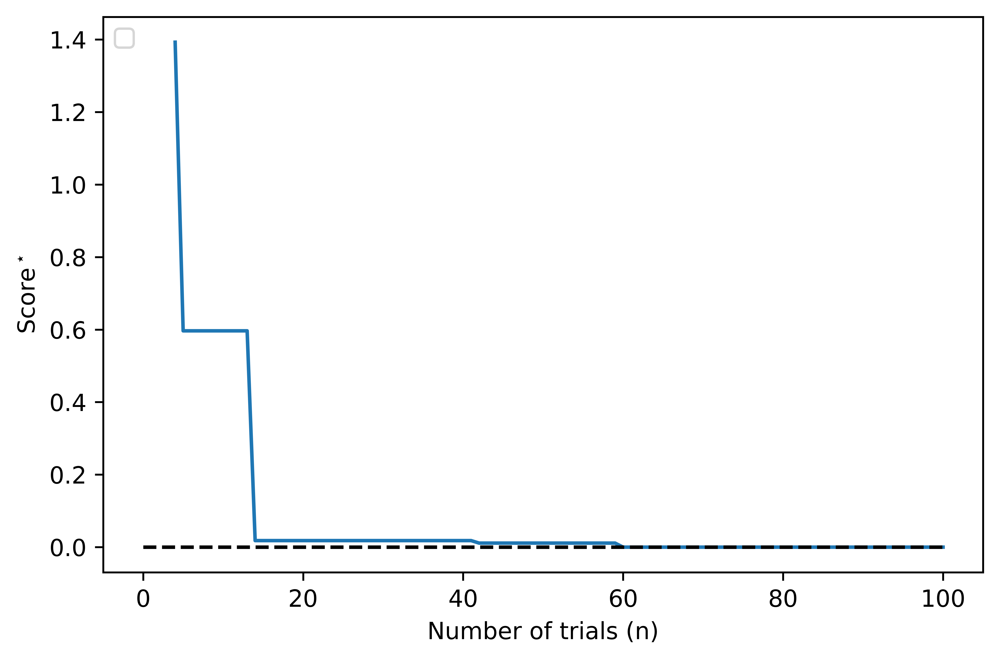

In [43]:
targets_4 = [
    {'target': 100, 'limit': 90, 'priority': 1},
    {'target': 2, 'limit': 1.5, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 2}
]

score_4 = run_HOLA_trials(100, targets_4)

print(score_4)

In [44]:
n_trials = range(1, 100 + 1, 1)
xx = [0, n_trials[-1]]  

targets_1 = [
    {'target': 112, 'limit': 90, 'priority': 1},
    {'target': 3, 'limit': 1, 'priority': 1},
    {'target': 1, 'limit': 2, 'priority': 1}
]

targets_2 = [
    {'target': 112, 'limit': 100, 'priority': 1},
    {'target': 3, 'limit': 2, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 1}
]

targets_3 = [
    {'target': 100, 'limit': 90, 'priority': 1},
    {'target': 3, 'limit': 2.5, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 1}
]

targets_4 = [
    {'target': 100, 'limit': 90, 'priority': 1},
    {'target': 2, 'limit': 1.5, 'priority': 1},
    {'target': 1.2, 'limit': 1.5, 'priority': 2}
]

total_score_1 = calc_score(targets_1)
y_val_1 = total_score_1 

total_score_2 = calc_score(targets_2)
y_val_2 = total_score_2

total_score_3 = calc_score(targets_3)
y_val_3 = total_score_3 

total_score_4 = calc_score(targets_4)
y_val_4 = total_score_4 

print(y_val_1)
print(y_val_2)
print(y_val_3)
print(y_val_4)

0.26542124999999994
0.18895143333333336
0.1540506666666667
0.0


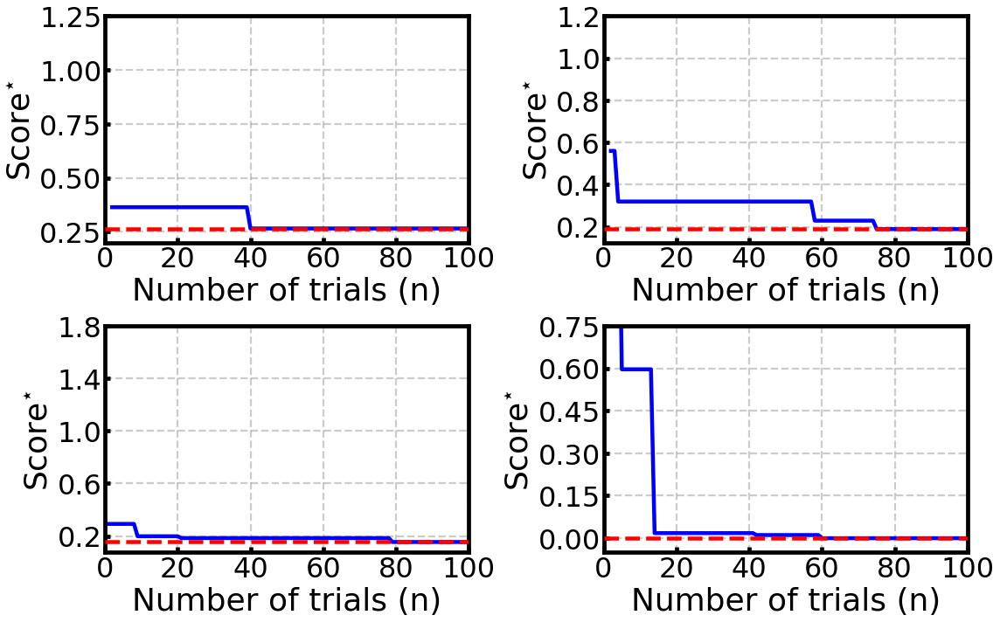

In [45]:
data1_x = n_trials
data1_y = score_1
data2_x = n_trials
data2_y = score_2
data3_x = n_trials
data3_y = score_3
data4_x = n_trials
data4_y = score_4


yy = [y_val_1, y_val_2, y_val_3, y_val_4]

x_labels = [
    r'Number of trials (n)',
    r'Number of trials (n)',
    r'Number of trials (n)',
    r'Number of trials (n)'
]

y_labels = [
    r'Score$^{\star}$',
    r'Score$^{\star}$',
    r'Score$^{\star}$',
    r'Score$^{\star}$'
]

x_ticks = [
    np.arange(0, 101, 20),
    np.arange(0, 101, 20),
    np.arange(0, 101, 20),
    np.arange(0, 101, 20)
]

y_ticks = [
    np.arange(0.25, 3, 0.25),
    np.arange(0, 3, 0.2),
    np.arange(0.2, 3, 0.4),
    np.arange(0, 3, 0.15)
]

x_ranges = [
    (0, 100),
    (0, 100),
    (0, 100),
    (0, 100)
]

y_ranges = [
    (0.2, 1.25),
    (0.125, 1.2),
    (0.075, 1.8),
    (-0.05, 0.75)
]

fig, axs = plt.subplots(2, 2, figsize=(16, 10))  # Adjusted for 2x2 subplots

for i, ax in enumerate(axs.flat):
    ax.plot(eval(f'data{i+1}_x'), eval(f'data{i+1}_y'), color='blue', linewidth=4.5, zorder=2)
    ax.plot(xx, [yy[i]]*2, 'r--', linewidth=4.5, zorder=3)

    ax.set_xticks(x_ticks[i])
    ax.set_yticks(y_ticks[i])
    ax.set_xlim(x_ranges[i])
    ax.set_ylim(y_ranges[i])
    ax.set_xlabel(x_labels[i], fontsize=36, color='black')
    ax.set_ylabel(y_labels[i], fontsize=36, color='black')

    line_width = 4.75
    for spine in ax.spines.values():
        spine.set_linewidth(line_width)

    ax.tick_params(axis='both', which='major', direction='in', length=6, width=4.75, colors='black', labelsize=32)
    ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1, colors='black')

    ax.grid(True, which='both', color='grey', linestyle='--', linewidth=2.25, zorder=0, alpha=0.4)

plt.show()
# fig.savefig("Fig_7_v2.pdf", format='pdf', bbox_inches='tight')
